# Overview
![Overview](../doc/Overview.svg "Title")

## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import datetime
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from simplec import Simulation

## Import Models

In [2]:
# Models
from models.demand.loadprofilegenerator import Household
from models.electricity_grid.electricity_grid_simple import Grid
from models.smart_meter.smart_meter import SimpleSmartMeter
from models.battery_storage.battery_storage import BatteryStorage
from models.pv.pv import PvgisPV
from models.TES.DHWH import TESModel

# Controller
from models.mp_controller.mp_controller import MPController
from models.mp_controller.opt_models.battery_storage import BES_MILP_model
from models.mp_controller.opt_models.energy_community import Residual_Load_MILP_model
from models.mp_controller.forcasting import Forcasting
from models.mp_controller.opt_models.dhwh import DHW_MILP_model_T_m_slack
from models.mp_controller.opt_models.objective import Objective

## Create Scenario
![Scenario](../doc/Scenario.jpg "Scenario")

In [3]:
sim = Simulation() # output_data_path=f'output/tutorial_{datetime.datetime.now().strftime("%Y%m%d_%H%M")}.csv')

In [4]:
# Grid
grid = Grid('grid')
sim.add_model(grid, watch_values=['P_substation'])

# Smart meter
sm = SimpleSmartMeter(name='sm')
sim.add_model(sm, watch_values=['P_grid', 'P_grid_mean_h'])
sim.connect(sm, grid, ('P_grid', 'P_'))

# PV
## Add the PvGis PV-Model with 2kW_peak use use data from the year 2021, to match the lpg data, connect it to the smartmeter
pv = PvgisPV('pv', peakpower=10, start=2021, end=2021)
sim.add_model(pv, watch_values=['P_pv'])
sim.connect(pv, sm, ('P_pv', 'P_'))

# Household Loads
household = Household(
    name='household',
    lpg_dir='data/loadprofilegenerator/CHR41 Family with 3 children, both at work/Results',
    resample_dot_m_ww=True
    )
sim.add_model(household, watch_values=['P_el', 'dot_m_ww'])
sim.connect(household, sm, ('P_el', 'P_'))

# DHWH
dhwh = TESModel(name='dhwh', delta_t=60, P_el_nom=2_000, V=0.4, N=10)
sim.add_model(dhwh, watch_values=['state', 'T_tw','T_0', 'P_el', 'P_el_mean_h'])

sim.connect(household, dhwh, ('dot_m_ww', 'dot_m_o_DHW'))
sim.connect_constant(21, dhwh, 'T_inf')
sim.connect_constant(12, dhwh, 'T_i_DHW')
sim.connect(dhwh, sm, ('P_el', 'P_'))

# Battery Storage
bes = BatteryStorage(
    name = 'bes',
    delta_t             = 60, # *60
    E_max               = 2_000*3600, # J
    E_0                 = 2_000*3600, # J
    P_max_charge        = 2_000, # W
    P_max_discharge     = 2_000, # W
)
sim.add_model(bes, watch_values=['P_set', 'P_grid', 'E', 'P_grid_mean_h'])
sim.connect(bes, sm, ('P_grid', 'P_'))

## Create Controller
![Controller](../doc/Controller.jpg "Controller")

In [5]:
mp_contr = MPController(name='MPC', n_periods=24, delta_t=3600, return_forcast=True, return_future_control_output=True, return_future_state=True) # , pprint_model_file='pyo_output.txt')

obj = Objective(name='obj', objective='peak-power-slack')  # 'self-consumption-slack')
mp_contr.add_model(obj)

## Model of household
milp_resid_load  = Residual_Load_MILP_model('Household')
mp_contr.add_model(milp_resid_load)

## Forcast for household
household_forecast = Forcasting('persistence_residual_load', init_val=0)
mp_contr.add_forcaster(household_forecast, milp_resid_load, 'P_resid')

# BES
milp_bes = BES_MILP_model(
    name='bes',
    E_max=2_000*3600, # J
    P_max_cha=2_000, # W
    P_max_dis=2_000, # W
    )

mp_contr.add_model(milp_bes)

# DHWH 1
milp_dhwh = DHW_MILP_model_T_m_slack(name='dhwh1', P_nom=2_000, C_tes=4200*400, slack_scale=1/1000, T_tes_max=85)
mp_contr.add_model(milp_dhwh)

## Forcast for temperature in DHWH 1
milp_dhwh_forcast = Forcasting('generic_single_var_persistence','dot_m_demand', init_val=0.02, delay=0)
mp_contr.add_forcaster(milp_dhwh_forcast, milp_dhwh, 'dot_m_demand')

# add controller to the simulation
sim.add_model(mp_contr, 
              watch_values=['Household.forecast.P_tot', 'bes.E_BES_0', 'dhwh1.T_tes_0', 'dhwh1.forecast.dot_m_demand'],
              watch_heavy=['obj.P_el_future', 'Household.forecast.P_resid_future', 'bes.P_el_future',
            'bes.E_future', 'dhwh1.on_future', 'dhwh1.slack_future', 'dhwh1.T_tes_future', 'dhwh1.forecast.dot_m_demand_future']) 

In [6]:
# connect inputs for controller
sim.connect(sm,   mp_contr,                        ('P_grid_mean_h', 'Household.forecast.P_tot'))
sim.connect(bes,  mp_contr, ('E', 'bes.E_BES_0'),      ('P_grid_mean_h', 'Household.forecast.P_flex_'))
sim.connect(dhwh, mp_contr, ('T_tw', 'dhwh1.T_tes_0'), ('P_el_mean_h',   'Household.forecast.P_flex_'))

sim.connect(household, mp_contr, ('dot_m_ww', 'dhwh1.forecast.dot_m_demand'))

# connect outputs for controller
sim.connect(mp_contr, bes, ('bes.P_el', 'P_set'), time_shifted=True, init_values={'bes.P_el': 0})
sim.connect(mp_contr, dhwh, ('dhwh1.on', 'state'), time_shifted=True, init_values={'dhwh1.on': 0})

## Run Simulation 

In [7]:
times = pd.date_range('2021-07-01 00:00:00', '2021-07-14 00:00:00', freq='1min', tz='Europe/Berlin')

sim.run(times)

Progress: 0Steps [00:00, ?Steps/s]

Progress: 18721Steps [01:41, 183.97Steps/s]


## Analyze Results
This is normally done in the postprocessing folder but for simplicity it is plaeced here for now

In [9]:
df_plot = sim.df # .fillna(method='ffill')

fig = make_subplots(rows=6, cols=1, shared_xaxes=True, vertical_spacing=0.05, 
                    specs=[[{"secondary_y": True}] for _ in range(6)],
                    subplot_titles=("PV", "Household", "BES", "Grid", "DHWH", "DHWH2"))

# Extract time index
dtindex = df_plot.index
row = 1

# PV
fig.add_trace(go.Scatter(x=dtindex, y=-df_plot[('pv', 'outputs', 'P_pv')]/1000, connectgaps=True,
                         mode='lines+markers', name='P_pv', line_shape='hv', line=dict(color='yellow')), row=row, col=1) # x=dtindex, 
fig.update_yaxes(title_text='Power in kW', row=row, col=1)
row += 1

# Household 1
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('household', 'outputs', 'P_el')]/1000, connectgaps=True,
                         mode='lines+markers', name='P_el, appartment 1', line_shape='hv'), row=row, col=1)
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('household', 'outputs', 'dot_m_ww')]/1000, connectgaps=True,
                         mode='lines+markers', name='dot_m_ww', line_shape='hv', line=dict(color='green')), row=row, col=1, secondary_y=True)
fig.update_yaxes(title_text='Power in kW', row=row, col=1, secondary_y=False)
fig.update_yaxes(title_text='Flow in kg/s', row=row, col=1, secondary_y=True)
row += 1

# BES
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('bes', 'inputs', 'P_set')]/1000, connectgaps=True,
                         mode='lines+markers', name='P_set, BES', line_shape='hv'), row=row, col=1)
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('bes', 'outputs', 'P_grid')]/1000, connectgaps=True,
                         mode='lines+markers', name='P_el, BES', line_shape='hv'), row=row, col=1)
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('bes', 'outputs', 'E')]/1000, connectgaps=True,
                         mode='lines+markers', name='E_el, BES', line=dict(color='green')), row=row, col=1, secondary_y=True) # , line_shape='hv'
fig.update_yaxes(title_text='Power in kW', row=row, col=1, secondary_y=False)
fig.update_yaxes(title_text='Energy in J', row=row, col=1, secondary_y=True)
row += 1

# Grid
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('grid', 'outputs', 'P_substation')]/1000,  connectgaps=True,
                         mode='lines+markers', name='P_substation', line_shape='hv'), row=row, col=1)
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('pv', 'outputs', 'P_pv')]/1000 + df_plot[('household', 'outputs', 'P_el')]/1000,  connectgaps=True,
                         mode='lines+markers', name='P_pv + P_load', line_shape='hv'), row=row, col=1)
fig.update_yaxes(title_text='Power in kW', row=row, col=1)
row += 1

# DHWH
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('dhwh', 'outputs', 'P_el')]/1000, connectgaps=True,
                         mode='lines+markers', name='P_el, DHWH', line_shape='hv'), row=row, col=1)
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('dhwh', 'inputs', 'state')], connectgaps=True,
                         mode='lines+markers', name='State, DHWH', line_shape='hv'), row=row, col=1)
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('dhwh', 'outputs', 'T_tw')],  connectgaps=True,
                         mode='lines+markers', name='T_tw, DHWH', line_shape='hv', line=dict(color='green')), row=row, col=1, secondary_y=True)
fig.update_yaxes(title_text='Power in kW', row=row, col=1, secondary_y=False)
fig.update_yaxes(title_text='T in °C', row=row, col=1, secondary_y=True)
row += 1

# DHWH2
fig.add_trace(go.Scatter(x=dtindex, y=df_plot[('household', 'outputs', 'dot_m_ww')]/1000, connectgaps=True,
                         mode='lines+markers', name='dot_m_ww', line_shape='hv', line=dict(color='blue')), row=row, col=1)
fig.update_yaxes(title_text='Flow in kg/s', row=row, col=1)

# Update layout
fig.update_layout(height=2400, title_text='Simulation Data', showlegend=True)
fig.show()

## Analyze single MPC optimization

In [10]:
sim.data.keys()  # [('MPC', 'outputs', 'obj.P_el_future')][timestamp]

dict_keys([('MPC', 'outputs', 'obj.P_el_future'), ('MPC', 'outputs', 'Household.forecast.P_resid_future'), ('MPC', 'outputs', 'bes.P_el_future'), ('MPC', 'outputs', 'bes.E_future'), ('MPC', 'outputs', 'dhwh1.on_future'), ('MPC', 'outputs', 'dhwh1.slack_future'), ('MPC', 'outputs', 'dhwh1.T_tes_future'), ('MPC', 'outputs', 'dhwh1.forecast.dot_m_demand_future')])

In [11]:
timestamp = pd.Timestamp('2021-07-06 00:00:00+0200', tz='Europe/Berlin')

fc_delta = '24h'

dtimes    = pd.date_range(timestamp, periods=24, freq='h')
dperiods  = pd.date_range(timestamp, periods=23, freq='h')

dperiods_fc = pd.date_range(timestamp-pd.Timedelta(fc_delta), periods=23, freq='h')
dslice_fc   = slice(timestamp-pd.Timedelta(fc_delta), timestamp)


minute_index = df_plot.loc[dslice_fc, :].index + pd.Timedelta(fc_delta)

n_rows = 5
fig = make_subplots(rows=n_rows, cols=1, shared_xaxes=True, vertical_spacing=0.05, 
                    specs=[[{"secondary_y": True}] for _ in range(n_rows)],
                    subplot_titles=("Previous Day Load Values", "Grid", "BES", "DHWH", "DHWH2"))

row = 1

# Verify Residual Load Forecasting

# Shifted Actual Values (should be equal with forecast)
# PV + Load (Residual Load)
# fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('pv', 'outputs', 'P_pv')].ffill(),
#                          mode='lines', name='P_pv', line_shape='hv'), row=row, col=1)
# fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('household', 'outputs', 'P_el')].ffill(),
#                          mode='lines', name='P_load', line_shape='hv'), row=row, col=1)
fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('pv', 'outputs', 'P_pv')].ffill() + df_plot.loc[dslice_fc, ('household', 'outputs', 'P_el')].ffill(),
                         mode='lines', name='P_pv + P_load', line_shape='hv'), row=row, col=1)

# # Flexibilities
# fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('dhwh', 'outputs', 'P_el')].ffill(),
#                          mode='lines', name='P_dhwh', line_shape='hv'), row=row, col=1)
# fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('bes', 'outputs', 'P_grid')].ffill(),
#                          mode='lines', name='P_bes', line_shape='hv'), row=row, col=1)
# fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('bes', 'outputs', 'P_grid')].ffill() + df_plot.loc[dslice_fc, ('dhwh', 'outputs', 'P_el')].ffill(),
#                          mode='lines', name='P_bes + P_dhwh', line_shape='hv'), row=row, col=1)


# # Flexibilities mean h
# fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('dhwh', 'outputs', 'P_el_mean_h')].ffill(),
#                          mode='lines', name='P_dhwh_mean_h', line_shape='hv'), row=row, col=1)
# fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('bes', 'outputs', 'P_grid_mean_h')].ffill(),
#                          mode='lines', name='P_bes_mean_h', line_shape='hv'), row=row, col=1)
# fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('bes', 'outputs', 'P_grid_mean_h')].ffill() + df_plot.loc[dslice_fc, ('dhwh', 'outputs', 'P_el_mean_h')].ffill(),
#                          mode='lines', name='P_bes_mean_h + P_dhwh_mean_h', line_shape='hv'), row=row, col=1)
# 
# 
# # Total grid power
# fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('bes', 'outputs', 'P_grid')].ffill() + df_plot.loc[dslice_fc, ('dhwh', 'outputs', 'P_el')].ffill() + df_plot.loc[dslice_fc, ('pv', 'outputs', 'P_pv')].ffill() + df_plot.loc[dslice_fc, ('household', 'outputs', 'P_el')].ffill(),
#                          mode='lines', name='P_pv + P_load + P_bes + P_dhwh', line_shape='hv'), row=row, col=1)



# # Smart Meter Data
# fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('sm', 'outputs', 'P_grid_mean_h')].ffill(),
#                          mode='lines', name='P_grid_mean_h', line_shape='hv'), row=row, col=1)

# Smart Meter Data
fig.add_trace(go.Scatter(x=minute_index, y=df_plot.loc[dslice_fc, ('sm', 'outputs', 'P_grid_mean_h')].ffill() - df_plot.loc[dslice_fc, ('dhwh', 'outputs', 'P_el_mean_h')].ffill() - df_plot.loc[dslice_fc, ('bes', 'outputs', 'P_grid_mean_h')].ffill(),
                         mode='lines', name='P_grid_mean_h - P_bes_mean_h - P_dhw_mean_h', line_shape='hv'), row=row, col=1) # 


row += 1
# # Forecasted Values
fig.add_trace(go.Scatter(x=dperiods, y=sim.data[('MPC', 'outputs', 'obj.P_el_future')][timestamp],
                         mode='lines', name='P_resid_optimal', line_shape='hv', line=dict(color='grey')), row=row, col=1) # , dash='dash'
fig.add_trace(go.Scatter(x=dperiods, y=sim.data[('MPC', 'outputs', 'Household.forecast.P_resid_future')][timestamp],
                         mode='lines', name='P_resid_fc', line=dict(color='green'), line_shape='hv'), row=row, col=1)  # , dash='dash'
fig.update_yaxes(title_text='Power in kW', row=row, col=1)


# fig.add_trace(go.Scatter(x=dperiods, y=-np.array(sim.data[('MPC', 'outputs', 'bes.P_el_future')][timestamp]) - np.array(sim.data[('MPC', 'outputs', 'dhwh1.on_future')][timestamp])*2000,
#                          mode='lines', name='P_flex', line_shape='hv'), row=row, col=1)


row += 1

# BES
fig.add_trace(go.Scatter(x=dperiods, y=sim.data[('MPC', 'outputs', 'bes.P_el_future')][timestamp],
                         mode='lines', name='P_BES_optimal', line_shape='hv'), row=row, col=1)
fig.add_trace(go.Scatter(x=dtimes, y=sim.data[('MPC', 'outputs', 'bes.E_future')][timestamp],
                         mode='lines', name='E_BES_optimal', line=dict(color='green')), row=row, col=1, secondary_y=True) # , line_shape='hv'
fig.update_yaxes(title_text='Power in kW', row=row, col=1, secondary_y=False)
fig.update_yaxes(title_text='Energy in J', row=row, col=1, secondary_y=True)
row += 1

# DHWH
fig.add_trace(go.Scatter(x=dperiods, y=sim.data[('MPC', 'outputs', 'dhwh1.forecast.dot_m_demand_future')][timestamp],
                         mode='lines', name='dot_m_ww_fc', line_shape='hv', line=dict(color='blue')), row=row, col=1)
fig.update_yaxes(title_text='Flow in kg/s', row=row, col=1)
row += 1

# DHWH2
fig.add_trace(go.Scatter(x=dperiods, y=sim.data[('MPC', 'outputs', 'dhwh1.on_future')][timestamp],
                         mode='lines', name='P_el_DHWH_optimal', line_shape='hv'), row=row, col=1)

fig.add_trace(go.Scatter(x=dtimes, y=sim.data[('MPC', 'outputs', 'dhwh1.T_tes_future')][timestamp],
                         mode='lines', name='T_tw_optimal', line=dict(color='green')), row=row, col=1, secondary_y=True)
fig.update_yaxes(title_text='Power in kW', row=row, col=1, secondary_y=False)
fig.update_yaxes(title_text='T in °C', row=row, col=1, secondary_y=True)
row += 1



# Update layout
fig.update_layout(height=1500, title_text='Simulation Data', showlegend=True)
fig.show()

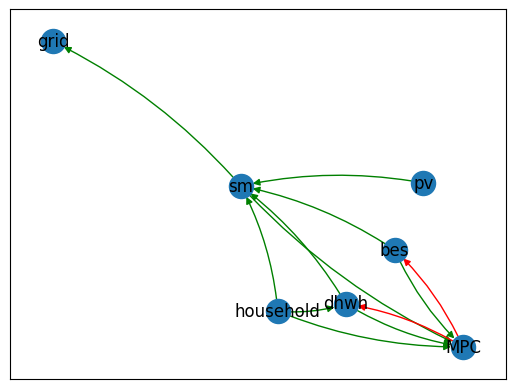

In [12]:
sim.draw_exec_graph()